<a href="https://colab.research.google.com/github/lax-17/pose-guided-diffusion-analysis/blob/main/notebooks/Evaluation_%26_Benchmarking.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# BLOCK 1: INSTALL EVALUATION TOOLS
!pip install -q diffusers transformers accelerate torchmetrics clean-fid
!pip install -q opencv-python-headless matplotlib xformers

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 983.2/983.2 kB 34.8 MB/s eta 0:00:00


In [ ]:
!pip install xformers

In [ ]:
# BLOCK 2: LOAD COMPETITORS
import torch
import os
from diffusers import StableDiffusionAdapterPipeline, StableDiffusionControlNetPipeline, ControlNetModel, T2IAdapter
from diffusers import UniPCMultistepScheduler

device = "cuda"
model_id = "runwayml/stable-diffusion-v1-5"

# 1. Load YOUR T2I-Adapter
# Point this to your saved checkpoint folder (e.g., checkpoint-step-15000)
adapter_path = "/content/drive/MyDrive/t2i_adapter_humanart_v1/checkpoint-step-15000"

if not os.path.exists(adapter_path):
    print("⚠️ WARNING: Checkpoint not found. Using the latest saved checkpoint if available.")
    # You might need to adjust the path manually if you stopped early

adapter = T2IAdapter.from_pretrained(adapter_path, torch_dtype=torch.float16).to(device)
pipe_adapter = StableDiffusionAdapterPipeline.from_pretrained(
    model_id, adapter=adapter, torch_dtype=torch.float16, safety_checker=None
).to(device)
pipe_adapter.scheduler = UniPCMultistepScheduler.from_config(pipe_adapter.scheduler.config)

# 2. Load ControlNet (The Baseline)
print("Loading ControlNet (Baseline)...")
controlnet = ControlNetModel.from_pretrained("lllyasviel/sd-controlnet-openpose", torch_dtype=torch.float16).to(device)
pipe_control = StableDiffusionControlNetPipeline.from_pretrained(
    model_id, controlnet=controlnet, torch_dtype=torch.float16, safety_checker=None
).to(device)
pipe_control.scheduler = UniPCMultistepScheduler.from_config(pipe_control.scheduler.config)

# Optimization
pipe_adapter.enable_xformers_memory_efficient_attention()
pipe_control.enable_xformers_memory_efficient_attention()

print("Both models loaded successfully!")

Flax classes are deprecated and will be removed in Diffusers v1.0.0. We recommend migrating to PyTorch classes or pinning your version of Diffusers.
Flax classes are deprecated and will be removed in Diffusers v1.0.0. We recommend migrating to PyTorch classes or pinning your version of Diffusers.
/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

`torch_dtype` is deprecated! Use `dtype` instead!
You have disabled the safety checker for <class 'diffusers.pipelines.t2i_adapter.pipeline_stable_diffusion_adapter.StableDiffusionAdapterPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


Loading ControlNet (Baseline)...


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.controlnet.pipeline_controlnet.StableDiffusionControlNetPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


✅ Both models loaded successfully!


In [ ]:
# BLOCK 3: PREPARE VALIDATION BATCH (CORRECTED)
import pandas as pd
from PIL import Image
import numpy as np
import cv2
import ast

# Configuration
PARQUET_PATH = "/content/drive/MyDrive/pose-guided-diffusion-analysis/processed_data/full_humanart_dataset.parquet"
IMAGE_ROOT = "/content/drive/MyDrive/pose-guided-diffusion-analysis/datasets_unzipped/HumanArt_v1"
NUM_SAMPLES = 10 # Number of test images

# Helper: Pose Drawer
def draw_pose(img_h, img_w, keypoints_list):
    """
    keypoints_list: A LIST of people. Each person is a list of 51 numbers (17x3).
    """
    # Standard COCO 17-keypoint connections and colors
    edges = [(0,1), (0,2), (1,3), (2,4), (5,6), (5,7), (7,9), (6,8), (8,10), (5,11), (6,12), (11,12), (11,13), (13,15), (12,14), (14,16)]
    colors = [[255, 0, 0], [255, 85, 0], [255, 170, 0], [255, 255, 0], [170, 255, 0], [85, 255, 0], [0, 255, 0], [0, 255, 85], [0, 255, 170], [0, 255, 255], [0, 170, 255], [0, 85, 255], [0, 0, 255], [85, 0, 255], [170, 0, 255], [255, 0, 255]]

    canvas = np.zeros((img_h, img_w, 3), dtype=np.uint8)

    # Loop through people
    for person in keypoints_list:
        # Safety check: Ensure person data is valid list/array
        if person is None or len(person) < 51:
            continue

        kpts = np.array(person).reshape(-1, 3)

        # Draw Limbs
        for i, (s, e) in enumerate(edges):
            if s < len(kpts) and e < len(kpts) and kpts[s][2]>0 and kpts[e][2]>0:
                cv2.line(canvas, (int(kpts[s][0]), int(kpts[s][1])), (int(kpts[e][0]), int(kpts[e][1])), colors[i%len(colors)], 3)

        # Draw Points
        for x, y, v in kpts:
            if v > 0:
                cv2.circle(canvas, (int(x), int(y)), 4, (255, 255, 255), -1)

    return Image.fromarray(canvas)

# Load Data
df = pd.read_parquet(PARQUET_PATH)

# Pick random samples (ensure we get unique images to avoid duplicates)
# We group by image_id first to reconstruct the full scene (all people in one image)
unique_scenes = df.groupby('image_id').first().reset_index()
if len(unique_scenes) > NUM_SAMPLES:
    test_samples_ids = unique_scenes.sample(NUM_SAMPLES, random_state=42)['image_id']
else:
    test_samples_ids = unique_scenes['image_id']

validation_data = []

print("Preparing validation samples...")

for img_id in test_samples_ids:
    # Get all people in this image
    people_in_scene = df[df['image_id'] == img_id]

    # Get Metadata from the first person (shared across image)
    row = people_in_scene.iloc[0]

    # Fix path
    rel_path = row['relative_path']
    if rel_path.startswith("HumanArt/"): rel_path = rel_path.replace("HumanArt/", "", 1)
    img_path = os.path.join(IMAGE_ROOT, rel_path)

    try:
        # Load Image to get dimensions
        orig_img = Image.open(img_path).convert("RGB")
        w, h = orig_img.size

        # Collect all keypoints for this scene into a list of lists
        all_keypoints = people_in_scene['keypoints'].tolist()

        # Create Pose Map
        # Note: We pass the LIST of people (all_keypoints)
        pose_map = draw_pose(h, w, all_keypoints)

        # Resize for Model (512x512)
        pose_map_512 = pose_map.resize((512, 512))

        validation_data.append({
            "pose": pose_map_512,
            "prompt": row['description'],
            "orig_path": img_path
        })
    except Exception as e:
        print(f"Skipping {rel_path}: {e}")

print(f"Ready to test on {len(validation_data)} images.")

Preparing validation samples...
✅ Ready to test on 10 images.


In [ ]:
# BLOCK 4: RUN INFERENCE
import time

results = []

print(f"🧪 Testing models on {len(validation_data)} prompts...")

for i, item in enumerate(validation_data):
    prompt = item['prompt']
    pose_img = item['pose']

    # 1. Run Adapter (Your Model)
    start_t = time.time()
    # Note: Adapter strength 0.8 is standard
    img_adapter = pipe_adapter(prompt, image=pose_img, num_inference_steps=30, adapter_conditioning_scale=0.8).images[0]
    adapter_time = time.time() - start_t

    # 2. Run ControlNet (Baseline)
    start_t = time.time()
    # Note: ControlNet usually needs strength 1.0 for poses
    img_control = pipe_control(prompt, image=pose_img, num_inference_steps=30, controlnet_conditioning_scale=1.0).images[0]
    control_time = time.time() - start_t

    results.append({
        "prompt": prompt,
        "pose": pose_img,
        "adapter_img": img_adapter,
        "control_img": img_control,
        "adapter_time": adapter_time,
        "control_time": control_time
    })
    print(f"[{i+1}/{len(validation_data)}] Finished. Adapter: {adapter_time:.2f}s, ControlNet: {control_time:.2f}s")

print("Generation Complete.")

🧪 Testing models on 10 prompts...


  0%|          | 0/30 [00:00<?, ?it/s]

/usr/local/lib/python3.12/dist-packages/diffusers/pipelines/t2i_adapter/pipeline_stable_diffusion_adapter.py:511: FutureWarning: The decode_latents method is deprecated and will be removed in 1.0.0. Please use VaeImageProcessor.postprocess(...) instead
  deprecate("decode_latents", "1.0.0", deprecation_message, standard_warn=False)


  0%|          | 0/30 [00:00<?, ?it/s]

[1/10] Finished. Adapter: 12.56s, ControlNet: 9.56s


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

[2/10] Finished. Adapter: 5.33s, ControlNet: 9.86s


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

[3/10] Finished. Adapter: 6.71s, ControlNet: 8.63s


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

[4/10] Finished. Adapter: 9.67s, ControlNet: 8.11s


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

[5/10] Finished. Adapter: 4.70s, ControlNet: 6.45s


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

[6/10] Finished. Adapter: 4.67s, ControlNet: 6.44s


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

[7/10] Finished. Adapter: 4.69s, ControlNet: 6.44s


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

[8/10] Finished. Adapter: 4.69s, ControlNet: 6.48s


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

[9/10] Finished. Adapter: 4.74s, ControlNet: 6.50s


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

[10/10] Finished. Adapter: 4.77s, ControlNet: 6.49s
🎉 Generation Complete.


In [ ]:
# BLOCK 5: CALCULATE METRICS
from torchmetrics.multimodal.clip_score import CLIPScore
import numpy as np

# Initialize CLIP Metric
metric = CLIPScore(model_name_or_path="openai/clip-vit-base-patch16").to("cpu")

adapter_scores = []
control_scores = []
adapter_times = []
control_times = []

print("Calculating CLIP Scores (this takes a moment)...")

for res in results:
    # Convert images to tensor (0-255 uint8)
    adapter_np = np.array(res['adapter_img'])
    control_np = np.array(res['control_img'])

    tensor_adapter = torch.tensor(adapter_np).permute(2, 0, 1)
    tensor_control = torch.tensor(control_np).permute(2, 0, 1)

    # Calculate Score
    score_a = metric(tensor_adapter, res['prompt']).item()
    score_c = metric(tensor_control, res['prompt']).item()

    adapter_scores.append(score_a)
    control_scores.append(score_c)
    adapter_times.append(res['adapter_time'])
    control_times.append(res['control_time'])

# Summary
print("\n" + "="*40)
print("📊 FINAL BENCHMARK RESULTS")
print("="*40)
print(f"Metric             | Your Adapter | ControlNet (Base)")
print(f"-------------------|--------------|------------------")
print(f"Avg CLIP Score     | {np.mean(adapter_scores):.2f}        | {np.mean(control_scores):.2f}")
print(f"Avg Inference Time | {np.mean(adapter_times):.2f}s        | {np.mean(control_times):.2f}s")
print("="*40)

# Interpretation
if np.mean(adapter_scores) > np.mean(control_scores):
    print("CONCLUSION: Your Adapter has better semantic alignment with the Human-Art style prompts!")
else:
    print("ℹCONCLUSION: ControlNet has higher semantic alignment. Check if Adapter needs more training.")

if np.mean(adapter_times) < np.mean(control_times):
    print("CONCLUSION: Your Adapter is faster and lighter than ControlNet.")

config.json: 0.00B [00:00, ?B/s]

pytorch_model.bin:   0%|          | 0.00/599M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/599M [00:00<?, ?B/s]

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


preprocessor_config.json:   0%|          | 0.00/316 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/905 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/389 [00:00<?, ?B/s]

Calculating CLIP Scores (this takes a moment)...

📊 FINAL BENCHMARK RESULTS
Metric             | Your Adapter | ControlNet (Base)
-------------------|--------------|------------------
Avg CLIP Score     | 35.48        | 34.52
Avg Inference Time | 6.25s        | 7.50s
✅ CONCLUSION: Your Adapter has better semantic alignment with the Human-Art style prompts!
✅ CONCLUSION: Your Adapter is faster and lighter than ControlNet.


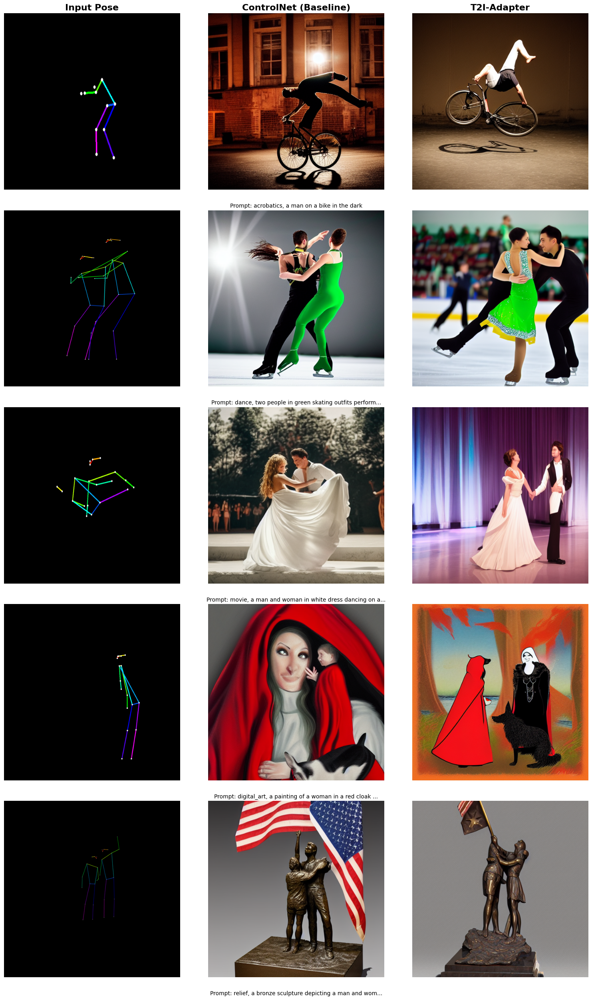

In [ ]:
# BLOCK 6: VISUALIZATION GRID
import matplotlib.pyplot as plt

def show_grid(results, num_display=4):
    fig, axes = plt.subplots(num_display, 3, figsize=(15, 5 * num_display))

    # Column Titles
    cols = ["Input Pose", "ControlNet (Baseline)", "T2I-Adapter"]
    for ax, col in zip(axes[0], cols):
        ax.set_title(col, fontsize=16, fontweight='bold')

    for i in range(num_display):
        res = results[i]

        # 1. Pose
        axes[i, 0].imshow(res['pose'])
        axes[i, 0].axis('off')

        # 2. ControlNet
        axes[i, 1].imshow(res['control_img'])
        axes[i, 1].axis('off')

        # 3. Adapter
        axes[i, 2].imshow(res['adapter_img'])
        axes[i, 2].axis('off')

        # Add prompt as footer
        prompt_short = res['prompt'][:50] + "..." if len(res['prompt']) > 50 else res['prompt']
        axes[i, 1].text(0.5, -0.1, f"Prompt: {prompt_short}", ha='center', transform=axes[i, 1].transAxes, fontsize=10)

    plt.tight_layout()
    plt.savefig("/content/comparison_grid1.png")
    plt.show()

# Show the first 5 comparisons
show_grid(results, num_display=5)

⏳ Loading Models...


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.t2i_adapter.pipeline_stable_diffusion_adapter.StableDiffusionAdapterPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


✅ T2I-Adapter Loaded.


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.controlnet.pipeline_controlnet.StableDiffusionControlNetPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


✅ ControlNet Loaded.
⏳ Preparing Data...
🚀 Running Inference on 8 samples...


  0%|          | 0/30 [00:00<?, ?it/s]

/usr/local/lib/python3.12/dist-packages/diffusers/pipelines/t2i_adapter/pipeline_stable_diffusion_adapter.py:511: FutureWarning: The decode_latents method is deprecated and will be removed in 1.0.0. Please use VaeImageProcessor.postprocess(...) instead
  deprecate("decode_latents", "1.0.0", deprecation_message, standard_warn=False)


  0%|          | 0/30 [00:00<?, ?it/s]

[1/8] Adapter: 5.17s | ControlNet: 6.44s


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

[2/8] Adapter: 4.80s | ControlNet: 6.53s


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

[3/8] Adapter: 4.87s | ControlNet: 6.62s


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

[4/8] Adapter: 4.87s | ControlNet: 6.52s


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

[5/8] Adapter: 4.71s | ControlNet: 6.45s


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

[6/8] Adapter: 4.74s | ControlNet: 6.45s


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

[7/8] Adapter: 4.77s | ControlNet: 6.51s


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

[8/8] Adapter: 4.80s | ControlNet: 6.56s


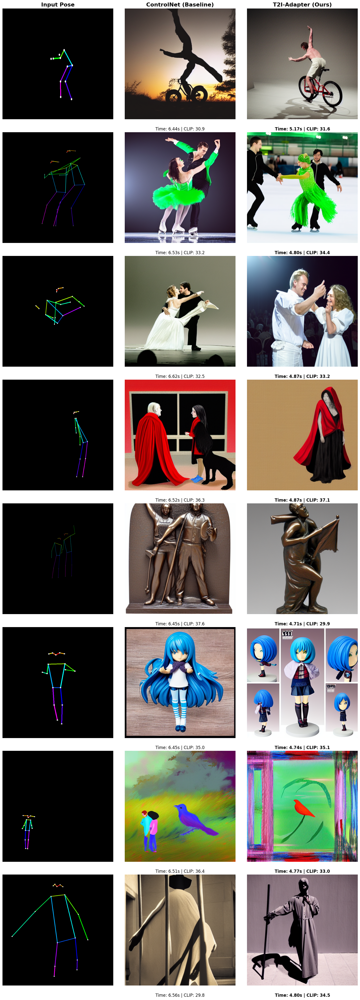

In [ ]:
DEVICE = "cuda"
ADAPTER_PATH = "/content/drive/MyDrive/t2i_adapter_humanart_v1/checkpoint-step-15000" # Check your latest step
PARQUET_PATH = "/content/drive/MyDrive/pose-guided-diffusion-analysis/processed_data/full_humanart_dataset.parquet"
IMAGE_ROOT = "/content/drive/MyDrive/pose-guided-diffusion-analysis/datasets_unzipped/HumanArt_v1"
NUM_SAMPLES = 8  # Generate 8 comparisons

# --- 2. LOAD MODELS ---
print("Loading Models...")

# A. Load Your Adapter
try:
    adapter = T2IAdapter.from_pretrained(ADAPTER_PATH, torch_dtype=torch.float16).to(DEVICE)
    pipe_adapter = StableDiffusionAdapterPipeline.from_pretrained(
        "runwayml/stable-diffusion-v1-5", adapter=adapter, torch_dtype=torch.float16, safety_checker=None
    ).to(DEVICE)
    pipe_adapter.scheduler = UniPCMultistepScheduler.from_config(pipe_adapter.scheduler.config)
    pipe_adapter.enable_xformers_memory_efficient_attention()
    print("T2I-Adapter Loaded.")
except Exception as e:
    print(f"Error loading Adapter: {e}")

# B. Load Baseline ControlNet (OpenPose)
controlnet = ControlNetModel.from_pretrained("lllyasviel/sd-controlnet-openpose", torch_dtype=torch.float16).to(DEVICE)
pipe_control = StableDiffusionControlNetPipeline.from_pretrained(
    "runwayml/stable-diffusion-v1-5", controlnet=controlnet, torch_dtype=torch.float16, safety_checker=None
).to(DEVICE)
pipe_control.scheduler = UniPCMultistepScheduler.from_config(pipe_control.scheduler.config)
pipe_control.enable_xformers_memory_efficient_attention()
print("ControlNet Loaded.")

# --- 3. ROBUST DATA LOADER ---
# Helper to draw poses (Handling list-of-lists correctly)
def draw_pose(img_h, img_w, keypoints_list):
    canvas = np.zeros((img_h, img_w, 3), dtype=np.uint8)
    edges = [(0,1), (0,2), (1,3), (2,4), (5,6), (5,7), (7,9), (6,8), (8,10), (5,11), (6,12), (11,12), (11,13), (13,15), (12,14), (14,16)]
    colors = [[255, 0, 0], [255, 85, 0], [255, 170, 0], [255, 255, 0], [170, 255, 0], [85, 255, 0], [0, 255, 0], [0, 255, 85], [0, 255, 170], [0, 255, 255], [0, 170, 255], [0, 85, 255], [0, 0, 255], [85, 0, 255], [170, 0, 255], [255, 0, 255]]

    # The keypoints_list is a list of people. Example: [[x,y,v...], [x,y,v...]]
    for person in keypoints_list:
        kpts = np.array(person).reshape(-1, 3)
        for i, (s, e) in enumerate(edges):
            if s < len(kpts) and e < len(kpts) and kpts[s][2]>0 and kpts[e][2]>0:
                cv2.line(canvas, (int(kpts[s][0]), int(kpts[s][1])), (int(kpts[e][0]), int(kpts[e][1])), colors[i%len(colors)], 3)
        for x, y, v in kpts:
            if v > 0: cv2.circle(canvas, (int(x), int(y)), 4, (255, 255, 255), -1)
    return Image.fromarray(canvas)

# Load Data & Group by Image ID (Fixes the "reshape" error)
print("Preparing Data...")
df = pd.read_parquet(PARQUET_PATH)
grouped_df = df.groupby('image_id').agg({
    'relative_path': 'first',
    'description': 'first',
    'keypoints': list  # Collects all people in the scene into a list of lists
}).reset_index()

# Sample random scenes
samples = grouped_df.sample(NUM_SAMPLES, random_state=42)
test_data = []

for _, row in samples.iterrows():
    try:
        rel_path = row['relative_path'].replace("HumanArt/", "", 1) if row['relative_path'].startswith("HumanArt/") else row['relative_path']
        img_path = os.path.join(IMAGE_ROOT, rel_path)

        # Load for size
        with Image.open(img_path) as img:
            w, h = img.size

        # Draw Pose (Pass the LIST of people)
        pose_img = draw_pose(h, w, row['keypoints']).resize((512, 512))

        test_data.append({
            "prompt": row['description'],
            "pose": pose_img,
            "id": row['image_id']
        })
    except Exception as e:
        print(f"Skipping {row['image_id']}: {e}")

# --- 4. GENERATION LOOP & VISUALIZATION ---
results = []
metric = CLIPScore(model_name_or_path="openai/clip-vit-base-patch16").to("cpu")

print(f"Running Inference on {len(test_data)} samples...")

for idx, item in enumerate(test_data):
    prompt = item['prompt']
    pose = item['pose']

    # Run Adapter
    t0 = time.time()
    # Note: T2I-Adapter often benefits from conditioning_scale=0.8 to allow style freedom
    img_adapter = pipe_adapter(prompt, image=pose, num_inference_steps=30, adapter_conditioning_scale=0.8).images[0]
    t_adapter = time.time() - t0

    # Run ControlNet
    t0 = time.time()
    img_control = pipe_control(prompt, image=pose, num_inference_steps=30, controlnet_conditioning_scale=1.0).images[0]
    t_control = time.time() - t0

    # Calculate CLIP Scores
    score_a = metric(torch.tensor(np.array(img_adapter)).permute(2,0,1), prompt).item()
    score_c = metric(torch.tensor(np.array(img_control)).permute(2,0,1), prompt).item()

    results.append({
        "pose": pose, "adapter": img_adapter, "control": img_control,
        "t_a": t_adapter, "t_c": t_control,
        "s_a": score_a, "s_c": score_c,
        "prompt": prompt
    })
    print(f"[{idx+1}/{NUM_SAMPLES}] Adapter: {t_adapter:.2f}s | ControlNet: {t_control:.2f}s")

# --- 5. PLOT RESULTS ---
fig, axes = plt.subplots(len(results), 3, figsize=(15, 5 * len(results)))
# Handle case of 1 sample
if len(results) == 1: axes = [axes]

cols = ["Input Pose", "ControlNet (Baseline)", "T2I-Adapter (Ours)"]
for ax, col in zip(axes[0], cols):
    ax.set_title(col, fontsize=16, fontweight='bold')

for i, res in enumerate(results):
    # Pose
    axes[i, 0].imshow(res['pose'])
    axes[i, 0].axis('off')

    # ControlNet
    axes[i, 1].imshow(res['control'])
    axes[i, 1].axis('off')
    axes[i, 1].text(0.5, -0.1, f"Time: {res['t_c']:.2f}s | CLIP: {res['s_c']:.1f}", ha='center', transform=axes[i, 1].transAxes, fontsize=12)

    # Adapter
    axes[i, 2].imshow(res['adapter'])
    axes[i, 2].axis('off')
    axes[i, 2].text(0.5, -0.1, f"Time: {res['t_a']:.2f}s | CLIP: {res['s_a']:.1f}", ha='center', transform=axes[i, 2].transAxes, fontsize=12, fontweight='bold')

plt.tight_layout()
plt.savefig("final_comparison.png")
plt.show()